In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import sys
import scanpy as sc
import scvi
import jp_single

import collections

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, color_map='YlOrRd')
sc.logging.print_version_and_date()


Running Scanpy 1.8.0, on 2021-11-18 15:39.


In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells

In [3]:
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

***
import data

In [4]:
adata = sc.read('./write/human_mouse_integrate_data_prepare_v4.0_adata_human_mouse.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 367850 × 11232
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', 'annotation', 'sub_annotation', 'annotation_old', '10X_chemistry', 'Muscle', 'Source', 'Old_annotation_subcluster', 'batch', 'Age_mo', 'Old_annotation', 'doublet_scores', 'predicted_doublets'
    var: 'GeneID-0', 'feature_types-0', 'genome-0', 'GeneName-0', 'n_counts-0', 'n_cells-0', 'human_gene-0', 'GeneID-1', 'feature_types-1', 'genome-1', 'GeneName-1', 'n_cells-1', 'human_gene-1', 'mito-1', 'GeneName-2', 'GeneName-3', 'mito-3'

In [6]:
adata.layers['counts'] = adata.X.copy()

In [7]:
# adata.obs['batch2'] = adata.obs['Species']

In [7]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata  # keep full dimension safe

normalizing counts per cell
    finished (0:00:02)


In [8]:
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=10000,
    layer="counts",
    batch_key="Species",
    subset=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [9]:
adata

AnnData object with n_obs × n_vars = 367850 × 10000
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', 'annotation', 'sub_annotation', 'annotation_old', '10X_chemistry', 'Muscle', 'Source', 'Old_annotation_subcluster', 'batch', 'Age_mo', 'Old_annotation', 'doublet_scores', 'predicted_doublets'
    var: 'GeneID-0', 'feature_types-0', 'genome-0', 'GeneName-0', 'n_counts-0', 'n_cells-0', 'human_gene-0', 'GeneID-1', 'feature_types-1', 'genome-1', 'GeneName-1', 'n_cells-1', 'human_gene-1', 'mito-1', 'GeneName-2', 'GeneName-3', 'mito-3', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [10]:
scvi.data.setup_anndata(adata, layer="counts", batch_key='Species', 
                        categorical_covariate_keys=["Source","Sample_ID", "Muscle", "10X_chemistry",'Sex'],
                        continuous_covariate_keys=["Mito_per"]
                       )

INFO     Using batches from adata.obs["Species"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 367850 cells, 10000 vars, 2       
         batches, 1 labels, and 0 proteins. Also registered 5 extra categorical covariates   
         and 1 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


In [11]:
vae = scvi.model.SCVI(adata, n_layers=3, n_latent=30)

In [12]:
vae.train()

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 22/22: 100%|██████████| 22/22 [15:03<00:00, 41.07s/it, loss=3.06e+03, v_num=1]


In [13]:
adata.obsm["X_scVI"] = vae.get_latent_representation()

In [14]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.leiden(adata)
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:57)
running Leiden clustering
    finished: found 35 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:05:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:07:58)


In [15]:
adata

AnnData object with n_obs × n_vars = 367850 × 10000
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', 'annotation', 'sub_annotation', 'annotation_old', '10X_chemistry', 'Muscle', 'Source', 'Old_annotation_subcluster', 'batch', 'Age_mo', 'Old_annotation', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden'
    var: 'GeneID-0', 'feature_types-0', 'genome-0', 'GeneName-0', 'n_counts-0', 'n_cells-0', 'human_gene-0', 'GeneID-1', 'feature_types-1', 'genome-1', 'GeneName-1', 'n_cells-1', 'human_gene-1', 'mito-1', 'GeneName-2', 'GeneName-3', 'mito-3', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', '_scvi', 'neighbors', 'leiden', 'umap'
    obsm: '_scvi_extra_categoricals', '_scvi_extra_continuous', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [171]:
adata.write('./write/human_mouse_integrate_scVI_v4.0_adata.h5ad')

In [4]:
adata = sc.read('./write/human_mouse_integrate_scVI_v4.0_adata.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 367850 × 10000
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', 'annotation', 'sub_annotation', 'annotation_old', '10X_chemistry', 'Muscle', 'Source', 'Old_annotation_subcluster', 'batch', 'Age_mo', 'Old_annotation', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'leiden_1', 'leiden_annotation', 'Species_annotation'
    var: 'GeneID-0', 'feature_types-0', 'genome-0', 'GeneName-0', 'n_counts-0', 'n_cells-0', 'human_gene-0', 'GeneID-1', 'feature_types-1', 'genome-1', 'GeneName-1', 'n_cells-1', 'human_gene-1', 'mito-1', 'GeneName-2', 'GeneName-3', 'mito-3', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Old_annotation_subcluster_colors', 'Sample_ID_colors', 'Source_colors', 'Species_annotation_colors', 'Species_colors', '_scvi', 'annotation_colors', 'hvg', 'leiden', 'leiden_1_color

In [5]:
adata

AnnData object with n_obs × n_vars = 367850 × 10000
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', 'annotation', 'sub_annotation', 'annotation_old', '10X_chemistry', 'Muscle', 'Source', 'Old_annotation_subcluster', 'batch', 'Age_mo', 'Old_annotation', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'leiden_1', 'leiden_annotation', 'Species_annotation'
    var: 'GeneID-0', 'feature_types-0', 'genome-0', 'GeneName-0', 'n_counts-0', 'n_cells-0', 'human_gene-0', 'GeneID-1', 'feature_types-1', 'genome-1', 'GeneName-1', 'n_cells-1', 'human_gene-1', 'mito-1', 'GeneName-2', 'GeneName-3', 'mito-3', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Old_annotation_subcluster_colors', 'Sample_ID_colors', 'Source_colors', 'Species_annotation_colors', 'Species_colors', '_scvi', 'annotation_colors', 'hvg', 'leiden', 'leiden_1_color

In [6]:
adata.obs['Species_annotation'] = np.array(adata.obs['Species'])+'-' + np.array(adata.obs['leiden_annotation'])

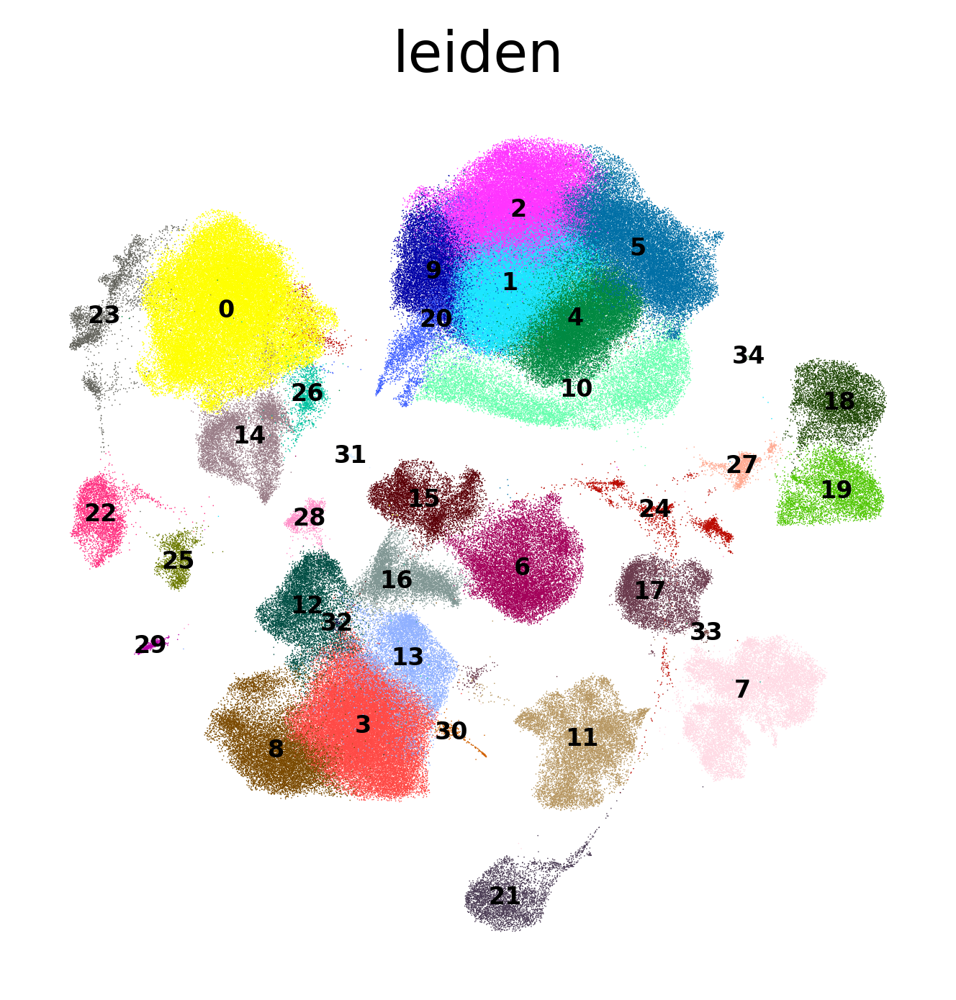

In [5]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=["leiden"], frameon=False,legend_fontsize=6,legend_loc='on data')
sc.settings.set_figure_params(dpi=200)

In [84]:
adata

AnnData object with n_obs × n_vars = 367850 × 10000
    obs: 'Sample_ID', 'Sex', 'Age_yo', 'Species', 'Age_bin', 'Mito_per', 'annotation', 'sub_annotation', 'annotation_old', '10X_chemistry', 'Muscle', 'Source', 'Old_annotation_subcluster', 'batch', 'Age_mo', 'Old_annotation', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'leiden_1'
    var: 'GeneID-0', 'feature_types-0', 'genome-0', 'GeneName-0', 'n_counts-0', 'n_cells-0', 'human_gene-0', 'GeneID-1', 'feature_types-1', 'genome-1', 'GeneName-1', 'n_cells-1', 'human_gene-1', 'mito-1', 'GeneName-2', 'GeneName-3', 'mito-3', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: '_scvi', 'hvg', 'leiden', 'neighbors', 'umap', 'leiden_colors', 'annotation_colors', 'Species_colors', 'Source_colors', 'leiden_1_colors', 'leiden_R_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categoricals', '_scvi_ext

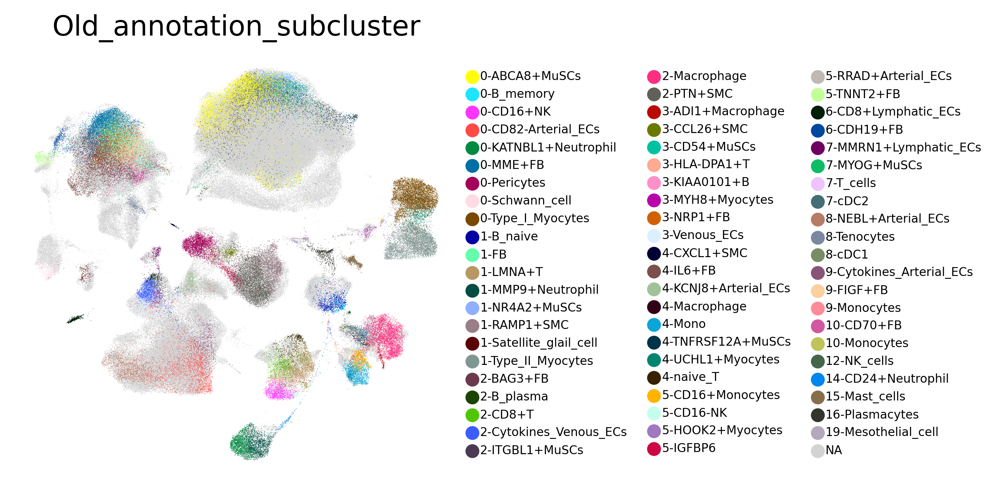

In [85]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=["Old_annotation_subcluster"], frameon=False,legend_fontsize=6)
sc.settings.set_figure_params(dpi=200)

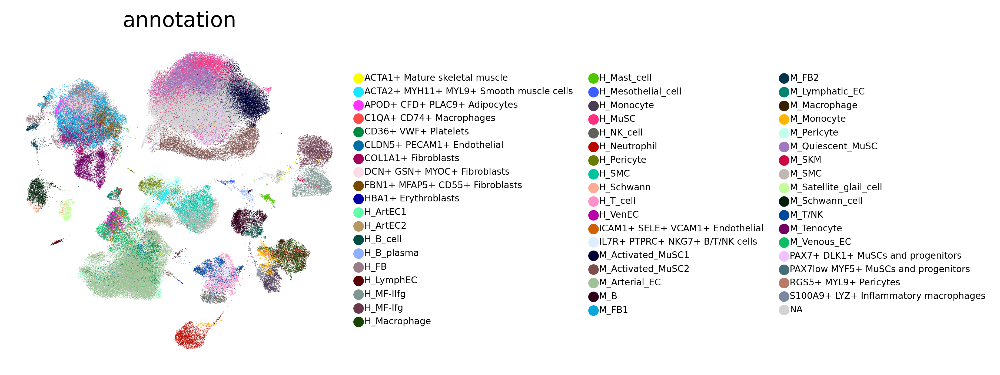

In [6]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=["annotation"], frameon=False,legend_fontsize=6)
sc.settings.set_figure_params(dpi=200)

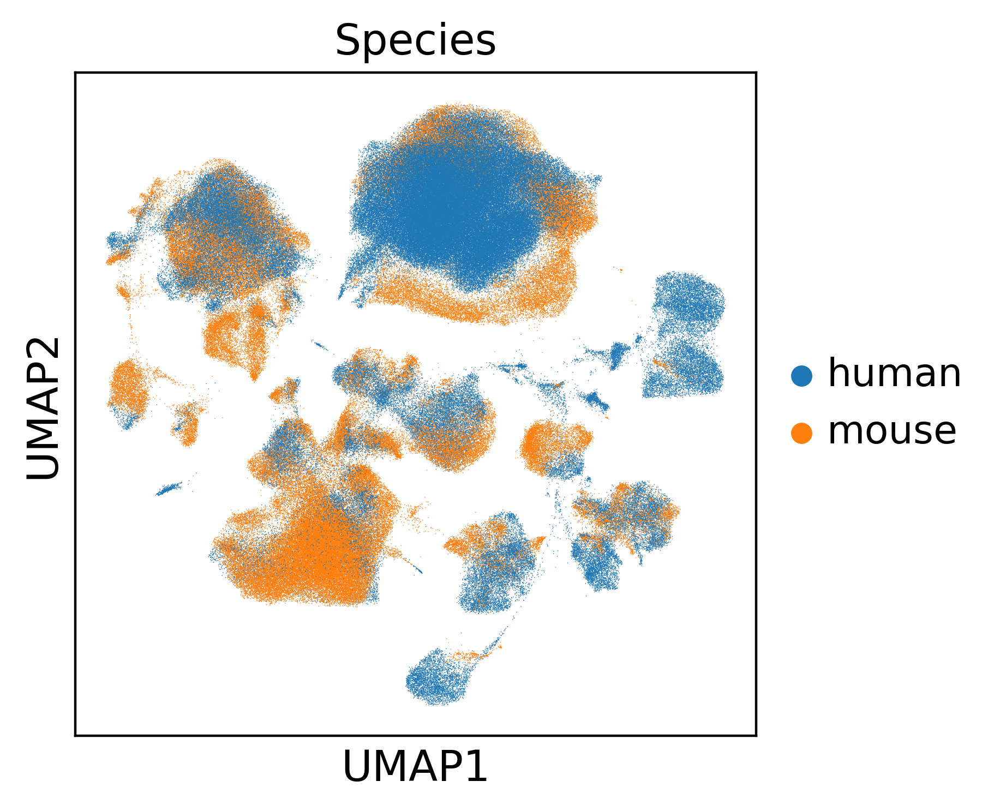

In [149]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=["Species"], save='human_mouse_integrate_scVI_v4.0_Species.pdf')
sc.settings.set_figure_params(dpi=200)

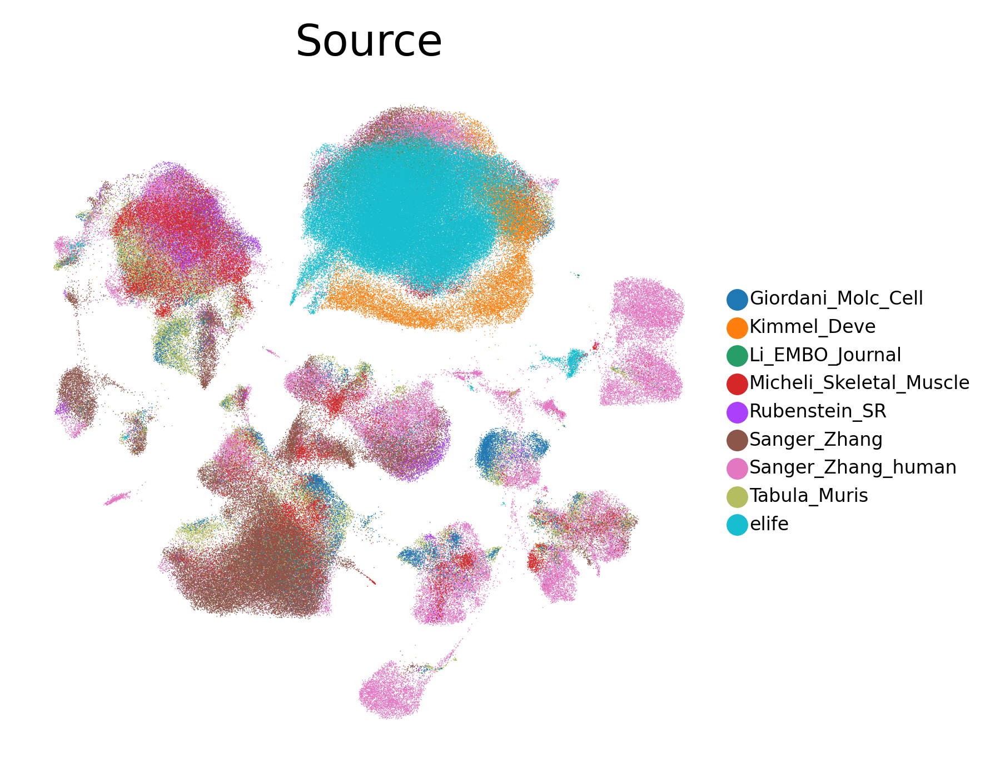

In [8]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=["Source"], frameon=False,legend_fontsize=6)
sc.settings.set_figure_params(dpi=200)

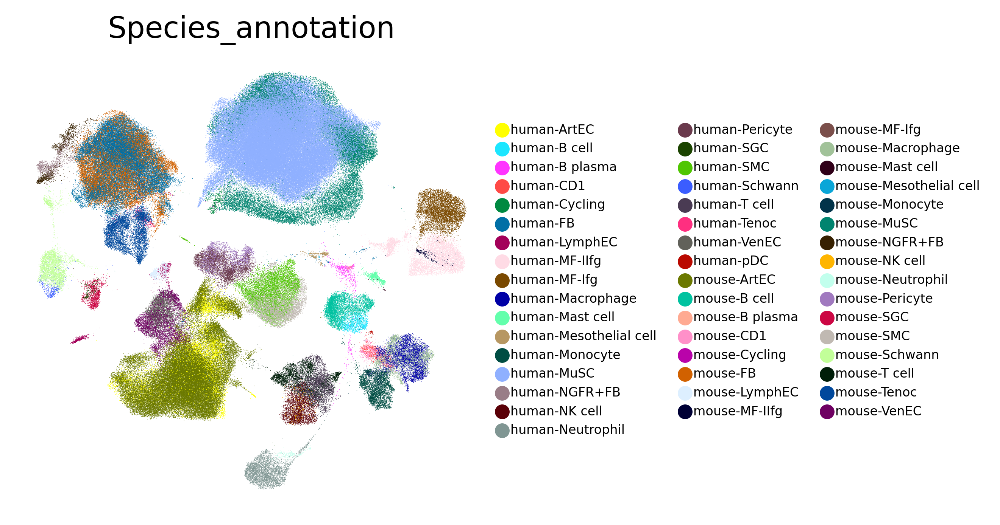

In [11]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=["Species_annotation"], frameon=False,legend_fontsize=6)

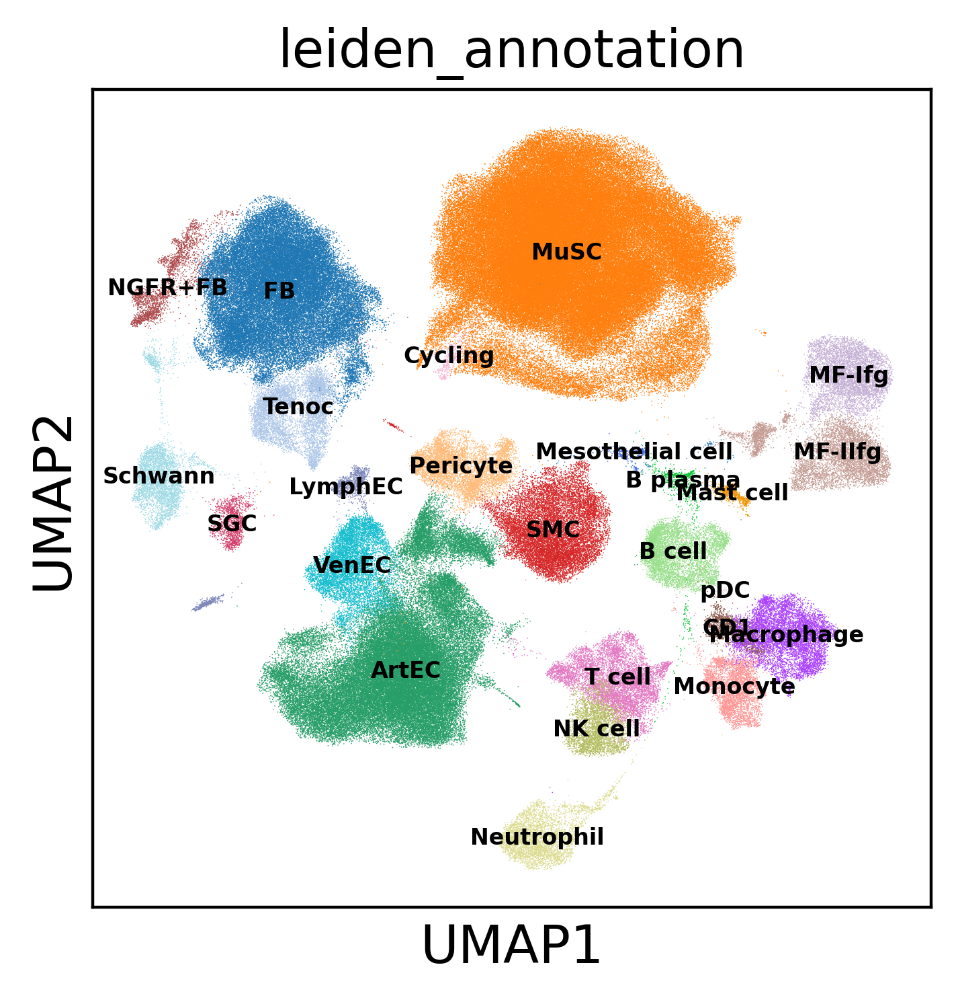

In [178]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(adata, color=['leiden_annotation']
           ,legend_loc='on data',
           legend_fontsize=6,
           save='human_mouse_integrate_scVI_v4.0_annotation.pdf'
          )
sc.settings.set_figure_params(dpi=100)

In [170]:

sc.pl.dotplot(adata,['DLK1','MYF5','CRLF1','GAL','PDE4DIP','ANKRD1', 'RTN2','PDK2','NOVA1','WISP2','CLEC3B','HHIP', 'STEAP2','CHAD', 'CILP2','NGFR','SLC22A3','STRA6','LRP4','PDZK1IP1', 'FBXO2','CLDN10','ZNF579','SCRG1','KCNMB4','CA12', 'CSMD1', 'LHPP','NEK1','EMID1', 'SLC36A2','CSDC2', 'ACTG2','OR51E2','RGS7BP','AGAP2', 'DCBLD1','VTN','ENPEP','SLC14A1','BTNL9','AQP7','RSAD2','MPZL2','C2CD4B','PRPF40B', 'ZNF436','SMOC1', 'GIPC2','NTS', 'PARD6G','IL7R', 'OXNAD1','DAPL1', 'CXCR6','CMC1','GZMM','NCR1', 'FASLG','P2RX5','HLA-DOB','CXCR5','PIM2','EDEM2', 'TP53INP1','IRF4', 'MED26','RIPK2','CLEC4M', 'TNIP3','MARCO', 'BCAT1','PF4','TREM2','OLR1', 'RETN', 'MEFV','GPR35','TMCC3','USP10','CAMP', 'IRG1','HPGD','SLC6A4', 'CYP11A1',],groupby='Species_annotation',categories_order=['human-MuSC','mouse-MuSC','human-MF-Ifg','human-MF-IIfg','mouse-MF-Ifg','mouse-MF-IIfg','human-FB','mouse-FB','human-Tenoc','mouse-Tenoc','human-NGFR+FB','mouse-NGFR+FB','human-Mesothelial cell','mouse-Mesothelial cell','human-SGC','mouse-SGC','human-Schwann','mouse-Schwann','human-SMC','mouse-SMC','human-Pericyte','mouse-Pericyte','human-ArtEC','mouse-ArtEC','human-VenEC','mouse-VenEC','human-LymphEC','mouse-LymphEC','human-T cell','mouse-T cell','human-NK cell','mouse-NK cell','human-B cell','mouse-B cell','human-B plasma','mouse-B plasma','human-pDC','human-CD1','mouse-CD1','human-Macrophage','mouse-Macrophage','human-Monocyte','mouse-Monocyte','human-Neutrophil','mouse-Neutrophil','human-Mast cell','mouse-Mast cell','human-Cycling','mouse-Cycling',],swap_axes=True,
             save='human_mouse_integrate_scVI_v4.0_Species_marker.pdf')

In [167]:

sc.pl.dotplot(adata,['DLK1','MYF5','CRLF1','GAL','PDE4DIP','ANKRD1', 'RTN2','PDK2','NOVA1','WISP2','CLEC3B','TNXB','HHIP', 'STEAP2','CHAD', 'CILP2','NGFR','SLC22A3','STRA6','LRP4','PDZK1IP1', 'FBXO2','CLDN10','ZNF579','SCRG1','KCNMB4','CA12', 'CSMD1', 'LHPP','NEK1','EMID1', 'SLC36A2','CSDC2', 'ACTG2','OR51E2','RGS7BP','AGAP2', 'DCBLD1','VTN','ENPEP','SLC14A1','BTNL9','AQP7','RSAD2','MPZL2','C2CD4B','PRPF40B', 'ZNF436','SMOC1', 'GIPC2','NTS', 'PARD6G','IL7R', 'OXNAD1','DAPL1', 'CXCR6','CMC1','GZMM','NCR1', 'FASLG','P2RX5','HLA-DOB','CXCR5','PIM2','EDEM2', 'TP53INP1','IRF4', 'MED26','RIPK2','CLEC4M', 'TNIP3','MARCO', 'BCAT1','PF4','TREM2','OLR1', 'RETN', 'MEFV','GPR35','TMCC3','USP10','CAMP', 'IRG1','HPGD','SLC6A4', 'CYP11A1',],groupby='Species_annotation',categories_order=['human-MuSC','mouse-MuSC','human-MF-Ifg','mouse-MF-Ifg','human-MF-IIfg','mouse-MF-IIfg','human-FB','mouse-FB','human-Tenoc','mouse-Tenoc','human-NGFR+FB','mouse-NGFR+FB','human-Mesothelial cell','mouse-Mesothelial cell','human-SGC','mouse-SGC','human-Schwann','mouse-Schwann','human-SMC','mouse-SMC','human-Pericyte','mouse-Pericyte','human-ArtEC','mouse-ArtEC','human-VenEC','mouse-VenEC','human-LymphEC','mouse-LymphEC','human-T cell','mouse-T cell','human-NK cell','mouse-NK cell','human-B cell','mouse-B cell','human-B plasma','mouse-B plasma','human-pDC','human-CD1','mouse-CD1','human-Macrophage','mouse-Macrophage','human-Monocyte','mouse-Monocyte','human-Neutrophil','mouse-Neutrophil','human-Mast cell','mouse-Mast cell','human-Cycling','mouse-Cycling',],)

... storing 'Species_annotation' as categorical


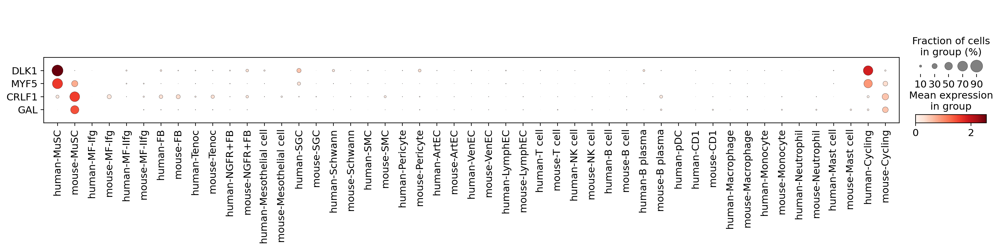

In [7]:

sc.pl.dotplot(adata,['DLK1','MYF5','CRLF1','GAL',],groupby='Species_annotation',categories_order=['human-MuSC','mouse-MuSC','human-MF-Ifg','mouse-MF-Ifg','human-MF-IIfg','mouse-MF-IIfg','human-FB','mouse-FB','human-Tenoc','mouse-Tenoc','human-NGFR+FB','mouse-NGFR+FB','human-Mesothelial cell','mouse-Mesothelial cell','human-SGC','mouse-SGC','human-Schwann','mouse-Schwann','human-SMC','mouse-SMC','human-Pericyte','mouse-Pericyte','human-ArtEC','mouse-ArtEC','human-VenEC','mouse-VenEC','human-LymphEC','mouse-LymphEC','human-T cell','mouse-T cell','human-NK cell','mouse-NK cell','human-B cell','mouse-B cell','human-B plasma','mouse-B plasma','human-pDC','human-CD1','mouse-CD1','human-Macrophage','mouse-Macrophage','human-Monocyte','mouse-Monocyte','human-Neutrophil','mouse-Neutrophil','human-Mast cell','mouse-Mast cell','human-Cycling','mouse-Cycling',],swap_axes=True)